# PARCIAL 3

### PUNTO 4

In [1]:

import matplotlib.pyplot as plt
import numpy as np
from numpy import linalg as LA
import random
import networkx as nx
import pandas as pd


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


- Construccion Grafo G1 (aleatorio de Erdös-Rényi)

El numero de nodos en G1 es: 101
El numero de aristas en G1 es: 247


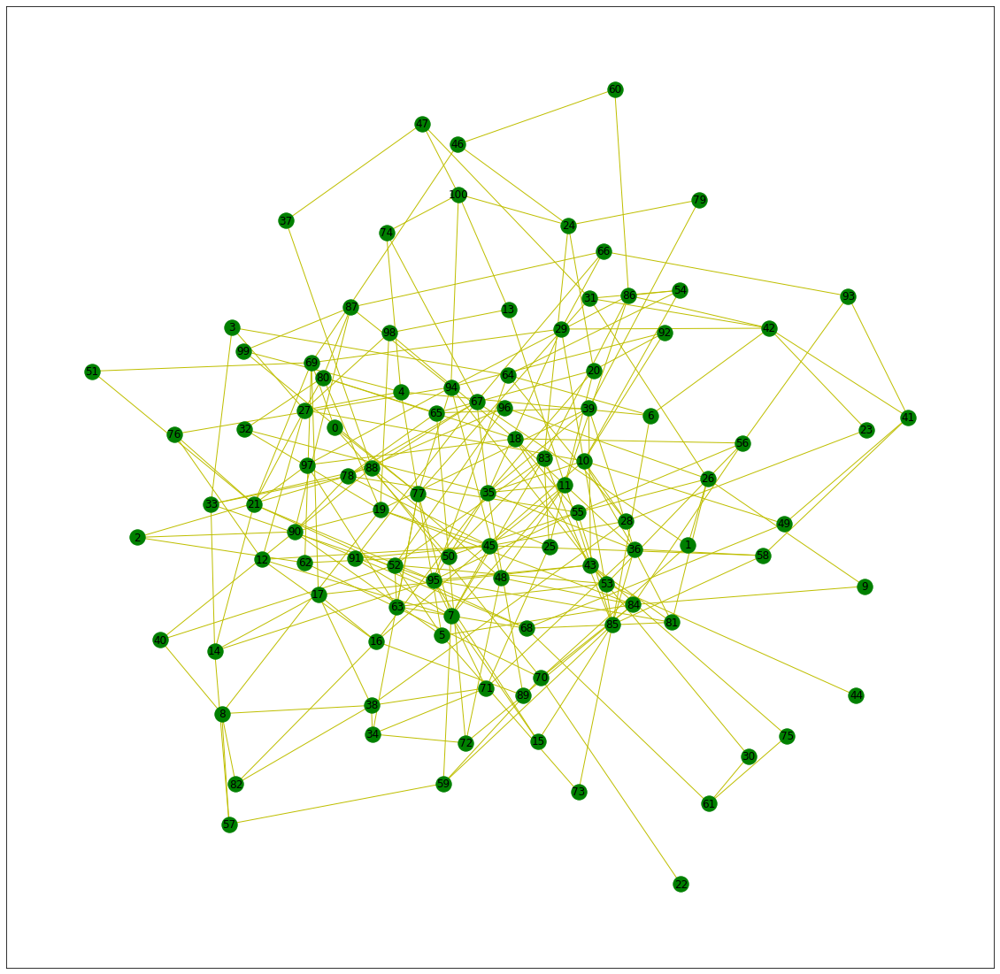

In [137]:
erdos_renyi_graph= nx.erdos_renyi_graph(101,0.05)
print('El numero de nodos en G1 es:',erdos_renyi_graph.number_of_nodes())
print('El numero de aristas en G1 es:',erdos_renyi_graph.number_of_edges())
plt.figure(figsize=(20,20))
nx.draw_networkx(erdos_renyi_graph, with_labels = True, node_color= 'g', edge_color='y')

- Construccion Grafo G2 (ley de potencias en la distribución de los grados)

In [96]:
n=101
m=99
seed = 20160 
G2 = nx.barabasi_albert_graph(n,m, seed=seed)
print('El numero de nodos en G2 es:',G2.number_of_nodes())
print('El numero de aristas en G2 es:',G2.number_of_edges())

El numero de nodos en G2 es: 101
El numero de aristas en G2 es: 198


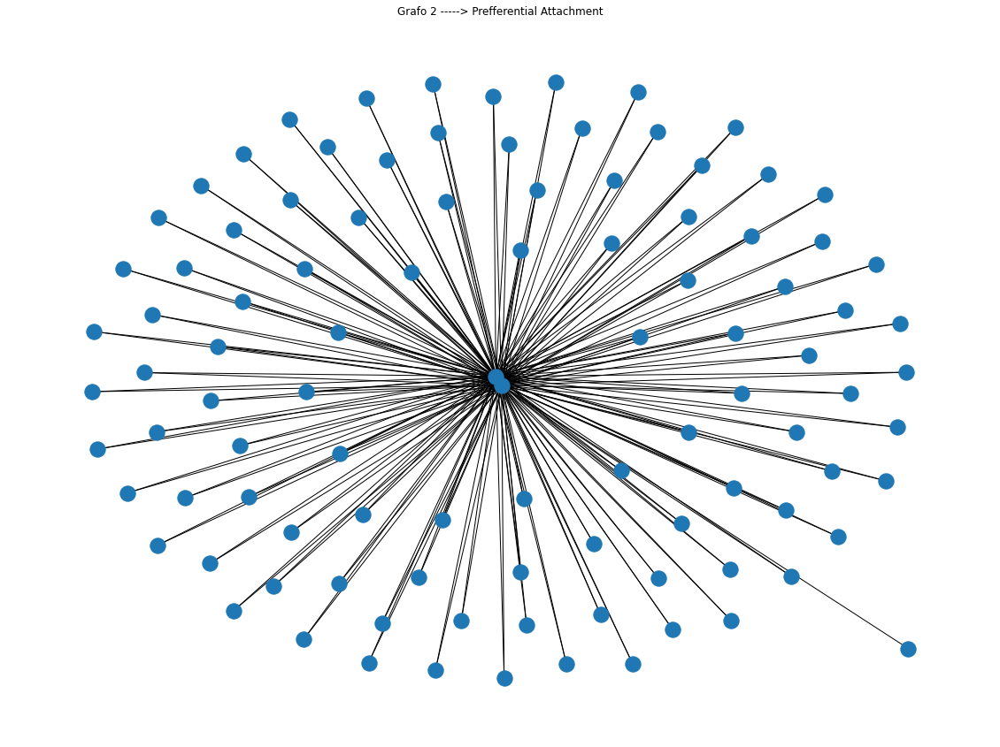

In [97]:
pos = nx.spring_layout(G2, seed=seed)  # Seed for reproducible layout
plt.figure(figsize=(20,15))
plt.title('Grafo 2 -----> Prefferential Attachment')
nx.draw(G2, pos=pos)
plt.show()

### SIMULACIONES

Visualizar red G1

(-0.6988459939034597,
 0.6842495940518494,
 -1.1878914394228248,
 0.9773337196402064)

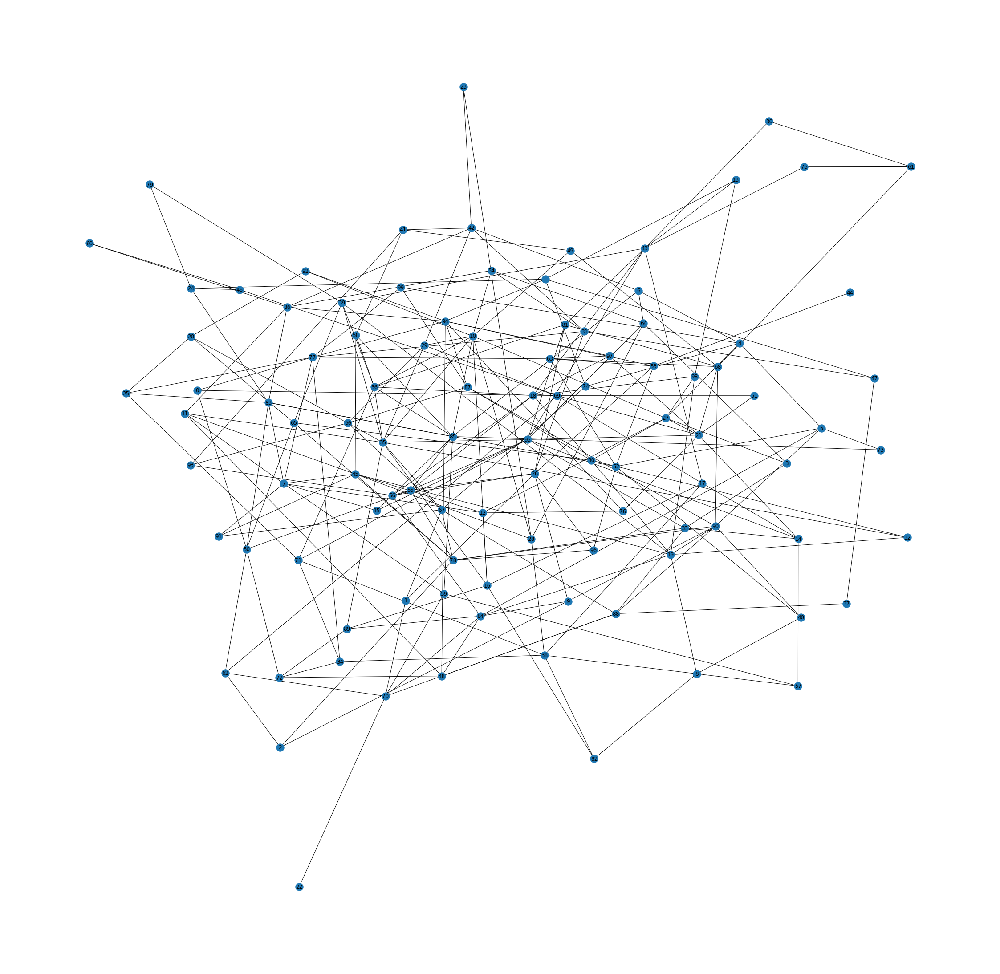

In [138]:
import random
E = erdos_renyi_graph.number_of_edges()
#initializing random weights
w = [random.random() for i in range(E)]
s = max(w)
w = [ i/s for i in w ] #normalizing
len(w)
k = 0
for i, j in erdos_renyi_graph.edges():
    erdos_renyi_graph[i][j]['weight'] = w[k]
    k+=1
import matplotlib.pyplot as plt
#edgewidth = [d['weight'] for (u,v,d) in erdos_renyi_graph.edges(data=True)]
# layout
#pos = nx.spring_layout(G, iterations=50)
pos = nx.spring_layout(erdos_renyi_graph)
labels = {}
for i in range(100):
    labels[i] = i
# rendering
plt.figure(figsize=(40,40))
nx.draw_networkx_nodes(erdos_renyi_graph, pos)
nx.draw_networkx_edges(erdos_renyi_graph, pos, node_size=500)
nx.draw_networkx_labels(erdos_renyi_graph, pos, labels)
plt.axis('off')

Visualizar red G2

(-1.200108137868035,
 1.1058999270874157,
 -1.0252151322979566,
 0.8810247329300763)

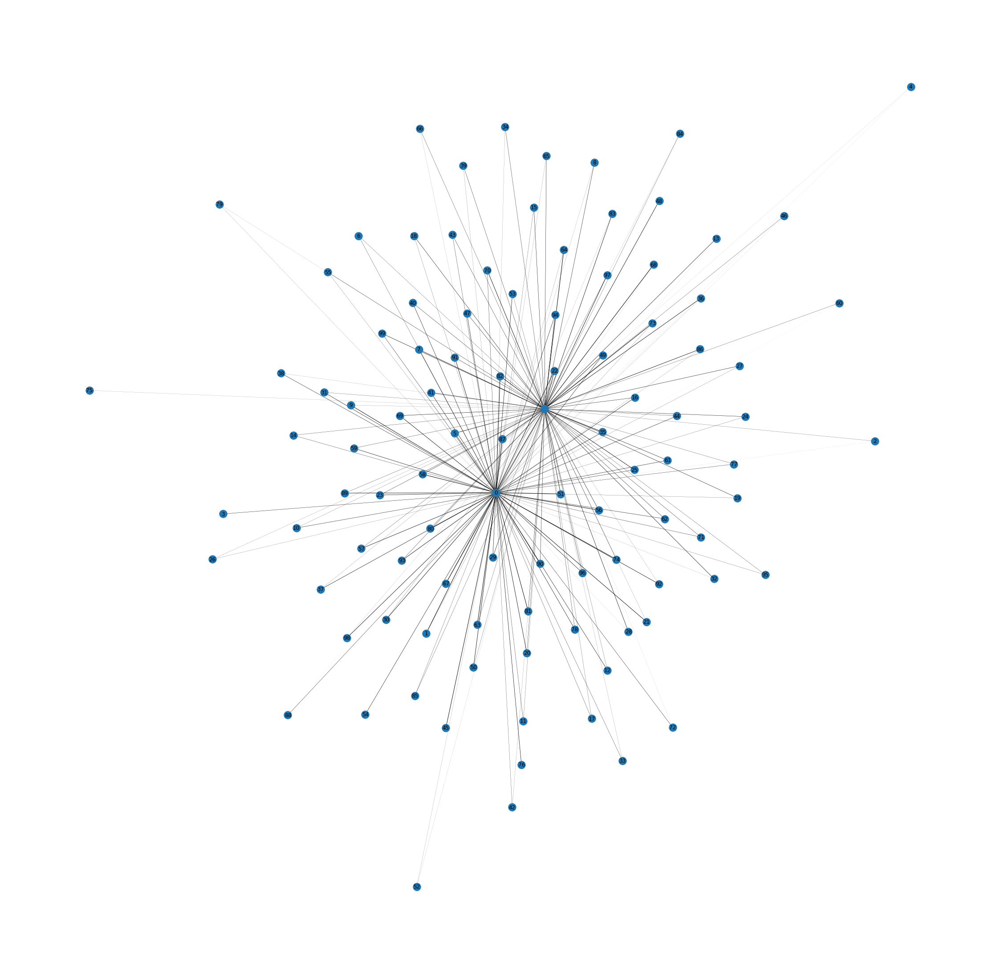

In [100]:
E = G2.number_of_edges()
#initializing random weights
w = [random.random() for i in range(E)]
s = max(w)
w = [ i/s for i in w ] #normalizing
len(w)
k = 0
for i, j in G2.edges():
    G2[i][j]['weight'] = w[k]
    k+=1
import matplotlib.pyplot as plt
edgewidth = [d['weight'] for (u,v,d) in G2.edges(data=True)]
# layout
#pos = nx.spring_layout(G, iterations=50)
pos = nx.spring_layout(G2)
labels = {}
for i in range(100):
    labels[i] = i
# rendering
plt.figure(figsize=(40,40))
nx.draw_networkx_nodes(G2, pos)
nx.draw_networkx_edges(G2, pos, width=edgewidth, node_size=500)
nx.draw_networkx_labels(G2, pos, labels)
plt.axis('off')

Simulacion G2

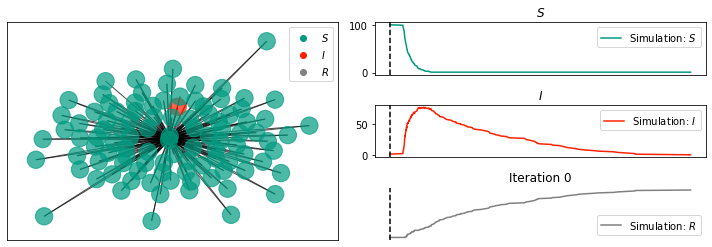

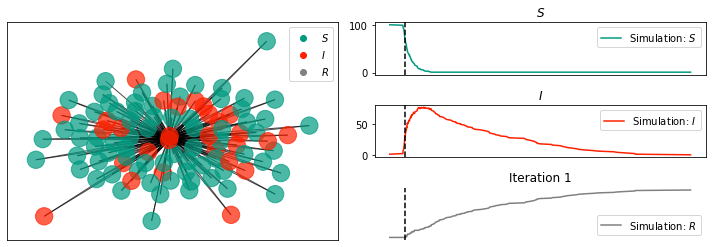

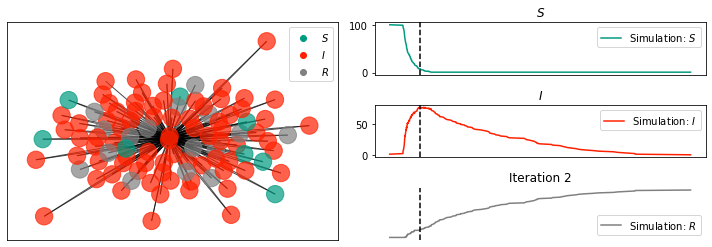

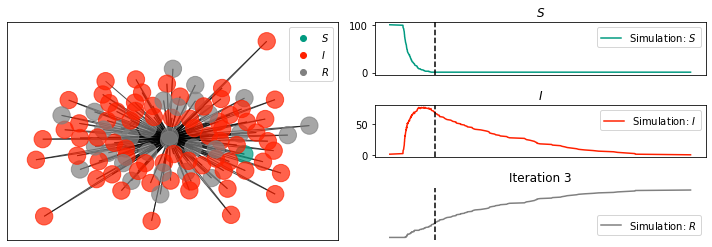

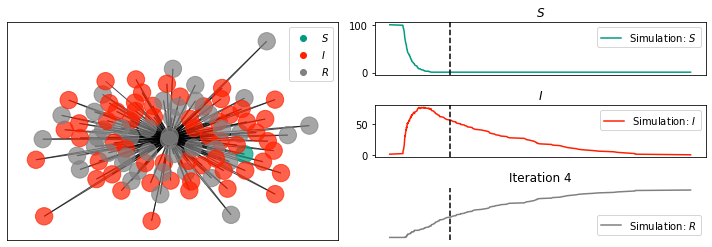

...

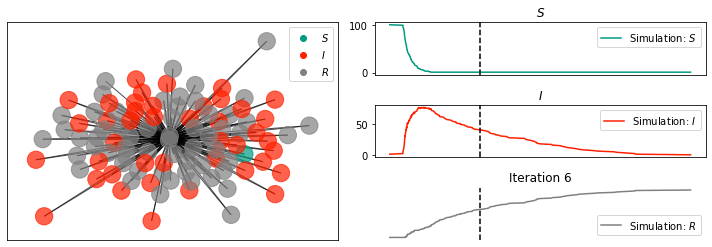

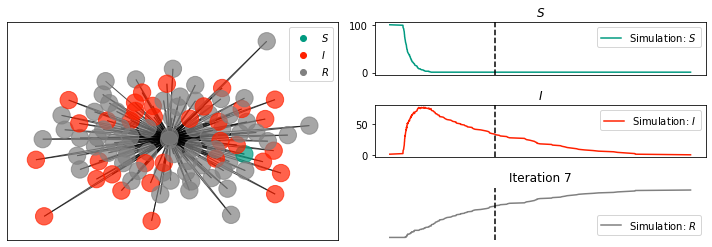

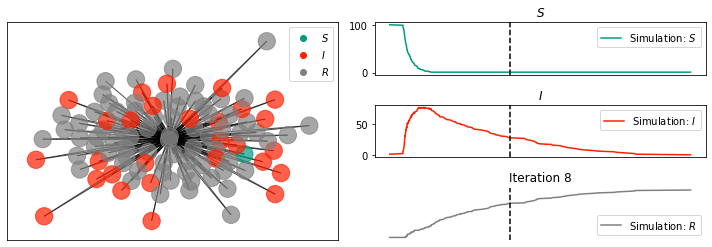

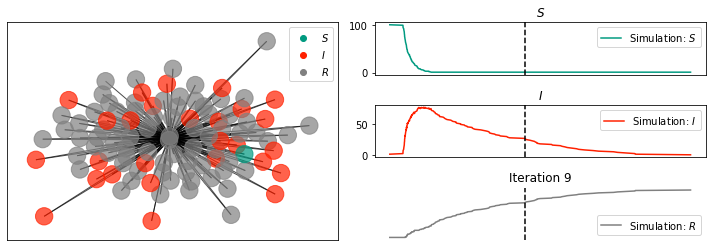

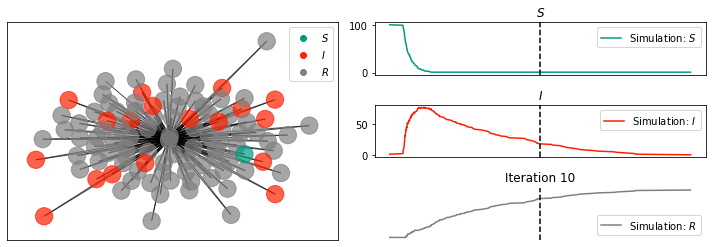

In [142]:
gamma = 0.2  
beta = 1.2 
r_0 = beta/gamma

N = 101 
I0 = 1  
R0 = 0
S0 = N - I0 -R0
pos = nx.spring_layout(G2)
nx_kwargs = { "pos": pos, "alpha": 0.7} 

sim = EoN.Gillespie_SIR(G2, tau = beta, gamma=gamma, rho = I0/N,tmin=0, tmax=33, return_full_data=True)

for i in range(0,11,1):
    sim.display(time = i,  **nx_kwargs)
    plt.axis('off') 
    plt.title("Iteration {}".format(i))
    plt.draw()

Simulacion G1

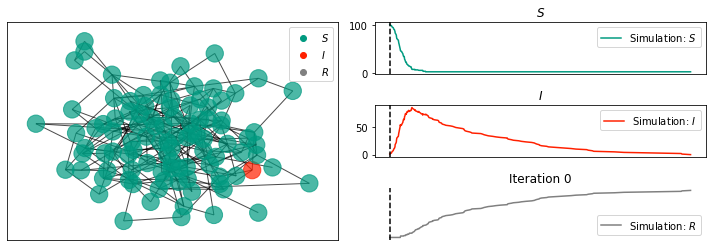

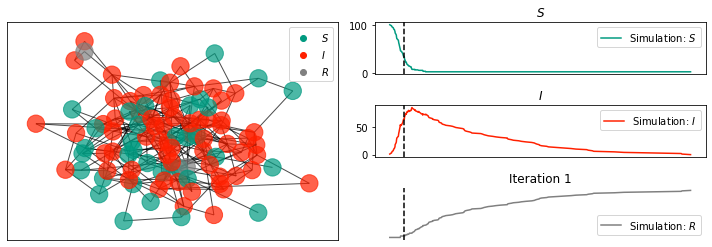

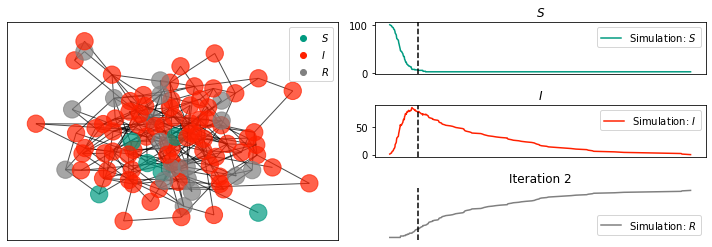

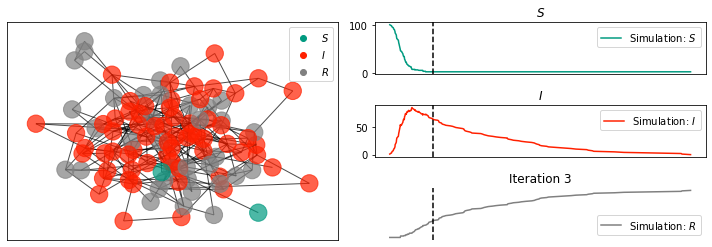

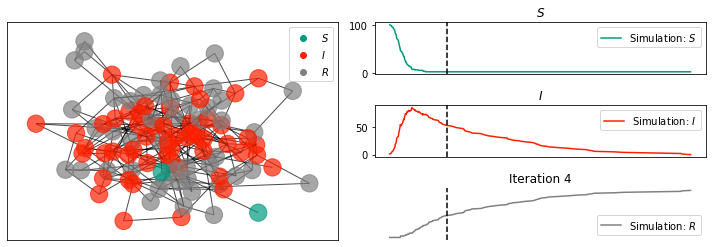

...

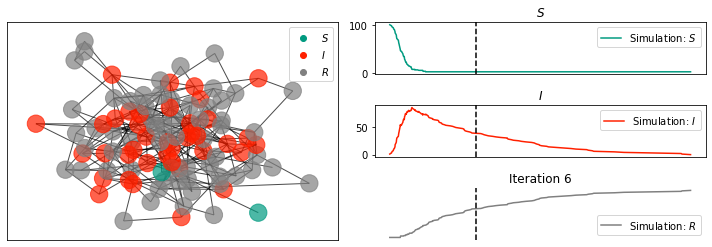

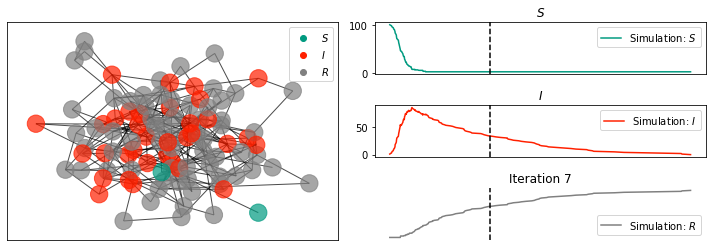

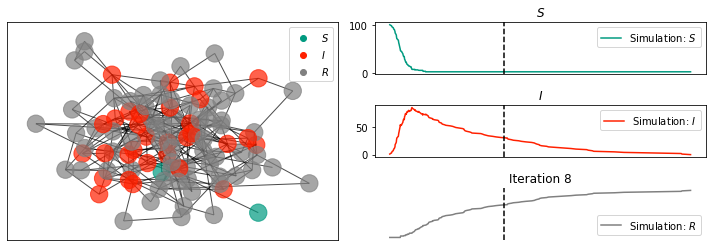

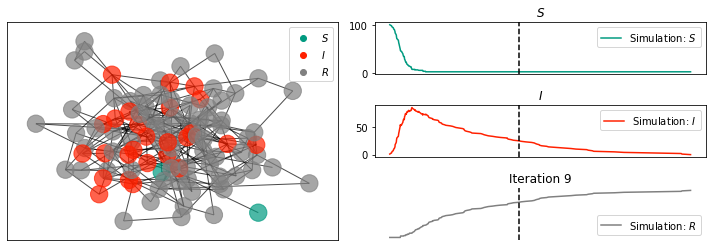

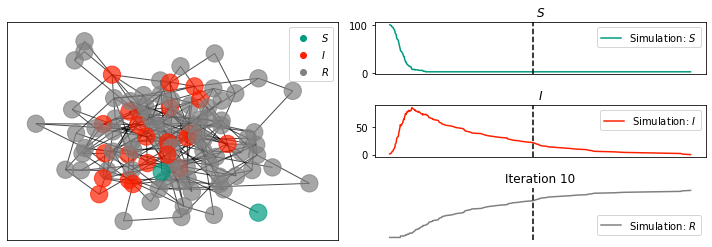

In [141]:
gamma = 0.2  
beta = 1.2 
r_0 = beta/gamma

N = 101 
I0 = 1   
R0 = 0
S0 = N - I0 -R0
pos = nx.spring_layout(erdos_renyi_graph)
nx_kwargs = { "pos": pos, "alpha": 0.7} 

sim = EoN.Gillespie_SIR(erdos_renyi_graph, tau = beta, gamma=gamma, rho = I0/N,tmin=0, tmax=33, return_full_data=True)

for i in range(0,11,1):
    sim.display(time = i,  **nx_kwargs)
    plt.axis('off') 
    plt.title("Iteration {}".format(i))
    plt.draw()

Grafico G2------> Preferential attachment 

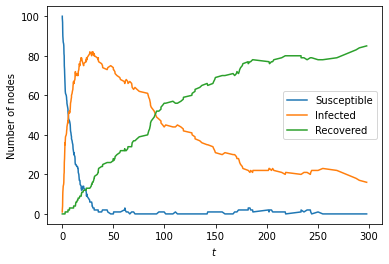

In [135]:
from collections import defaultdict

a = 0.1
b = 0.01
y = 0.001
d = 0.001

H = nx.DiGraph() 
H.add_edge('I', 'R', rate = b)  
H.add_edge('I', 'S', rate = y)  
H.add_edge('R', 'S', rate = d)  

J = nx.DiGraph() 
J.add_edge(('I', 'S'),('I', 'I'), rate = a)  
IC = defaultdict(lambda: 'S')

for node in range(102):
    IC[node] = 'S'
IC[0] = 'I'

return_statuses = ('S', 'I', 'R')

t, S, I, R = EoN.Gillespie_simple_contagion(G2, H, J, IC, return_statuses, tmax = 300)

plt.plot(t, S, label = 'Susceptible')
plt.plot(t, I, label = 'Infected')
plt.plot(t, R, label = 'Recovered')
plt.xlabel('$t$')
plt.ylabel('Number of nodes')
plt.legend()
plt.show()

Grafico G1---------> Erdos Renyi

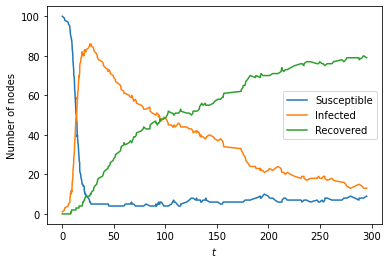

In [123]:

a = 0.1
b = 0.01
y = 0.001
d = 0.001


H = nx.DiGraph() 
H.add_edge('I', 'R', rate = b) 
H.add_edge('I', 'S', rate = y) 
H.add_edge('R', 'S', rate = d)  

J = nx.DiGraph() 
J.add_edge(('I', 'S'),('I', 'I'), rate = a)  
IC = defaultdict(lambda: 'S')

for node in range(102):
    IC[node] = 'S'
IC[0] = 'I'

return_statuses = ('S', 'I', 'R')

t, S, I, R = EoN.Gillespie_simple_contagion(erdos_renyi_graph, H, J, IC, return_statuses, tmax = 300)

plt.plot(t, S, label = 'Susceptible')
plt.plot(t, I, label = 'Infected')
plt.plot(t, R, label = 'Recovered')
plt.xlabel('$t$')
plt.ylabel('Number of nodes')
plt.legend()
plt.show()

Simulacion ------> G1 Erdos Renyi

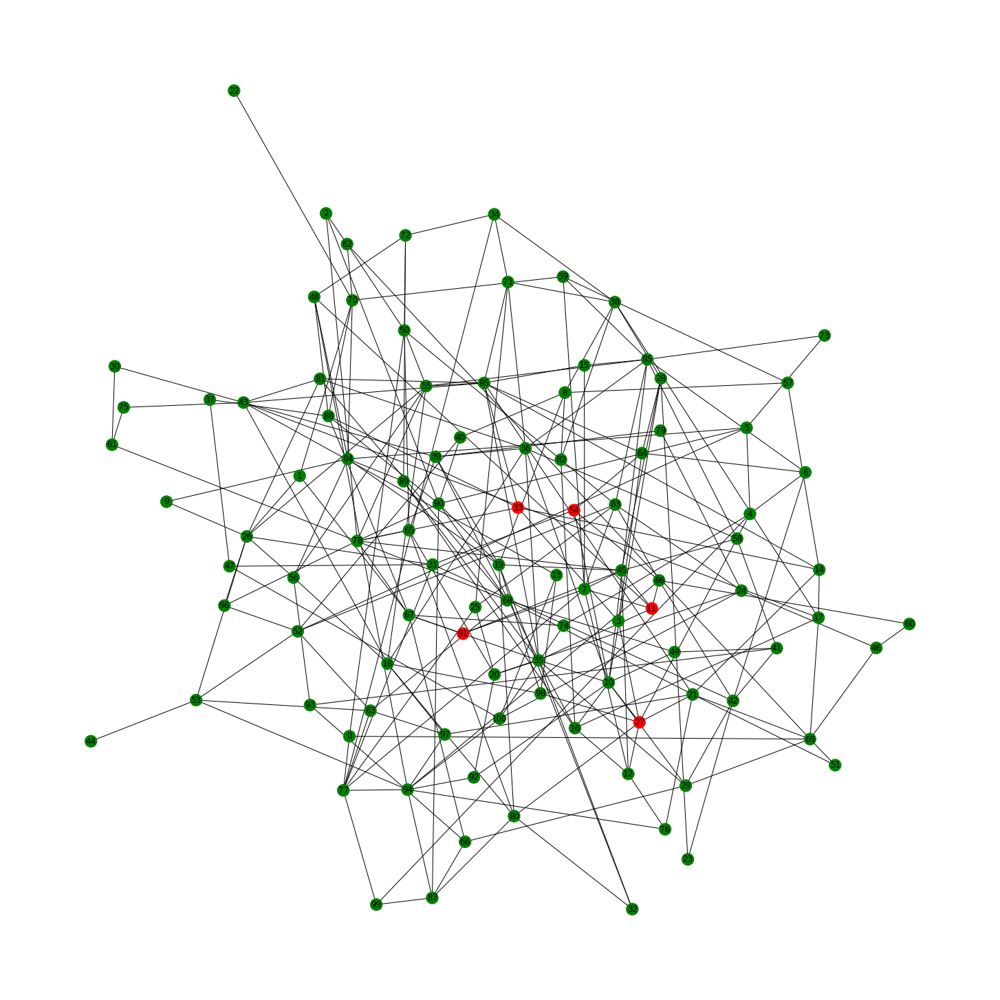

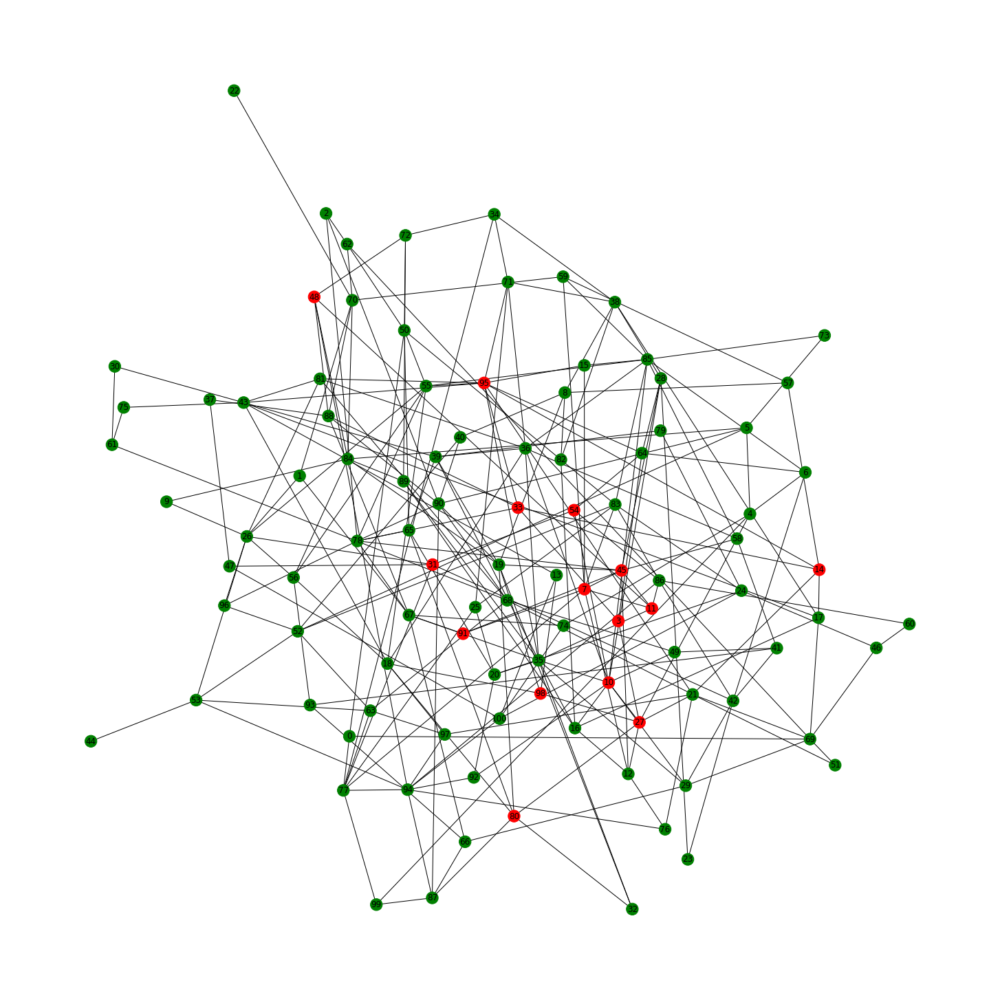

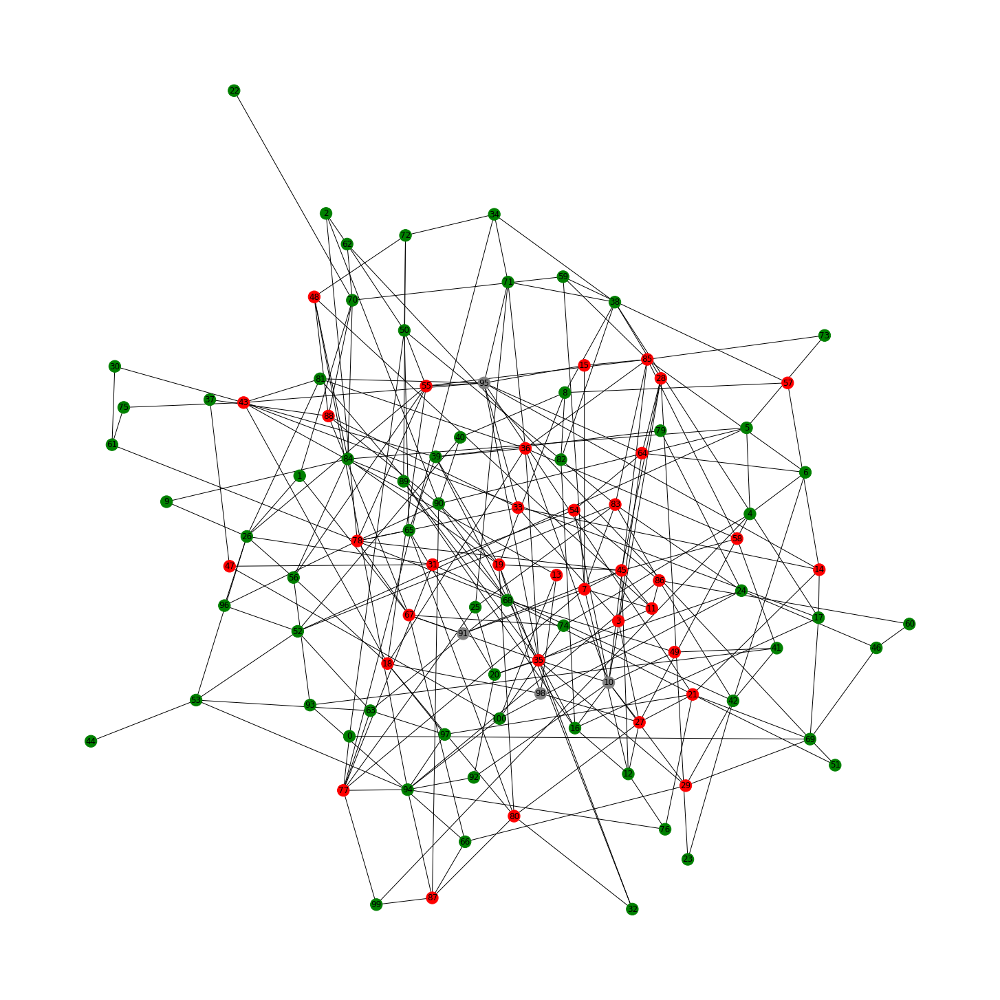

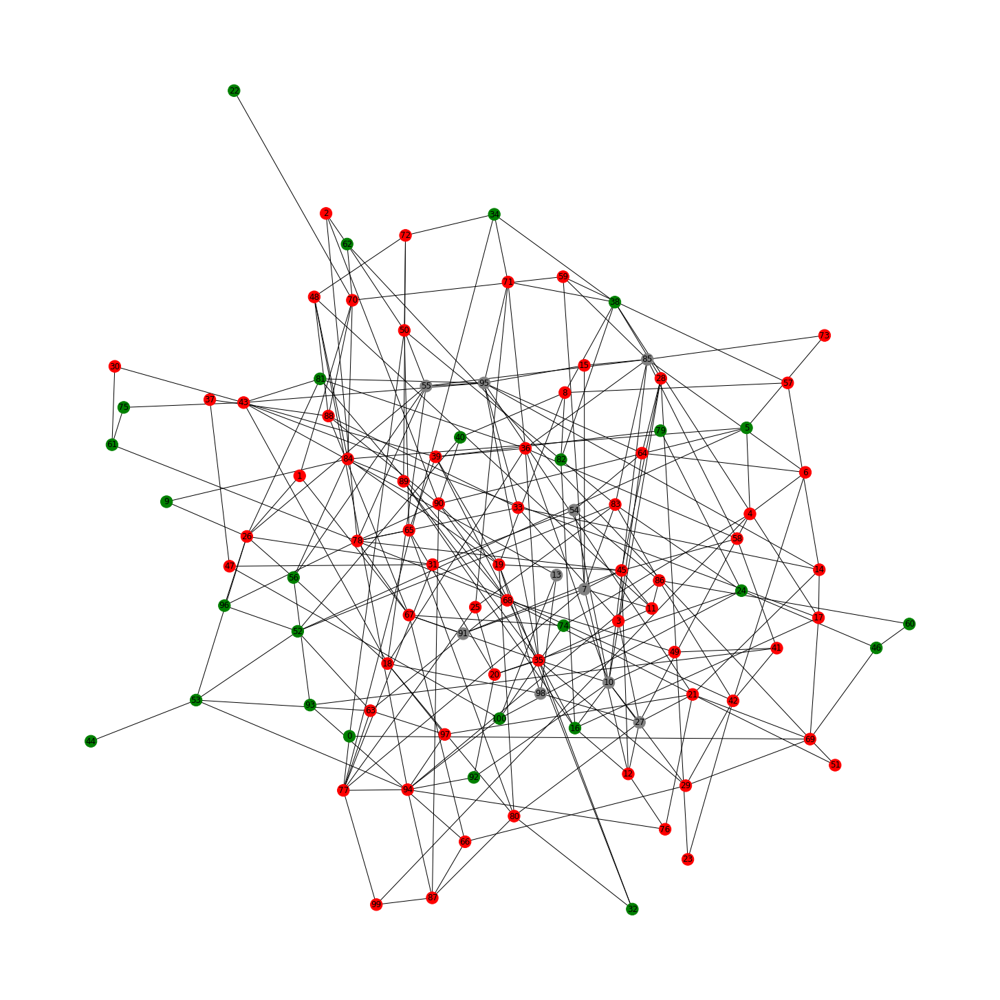

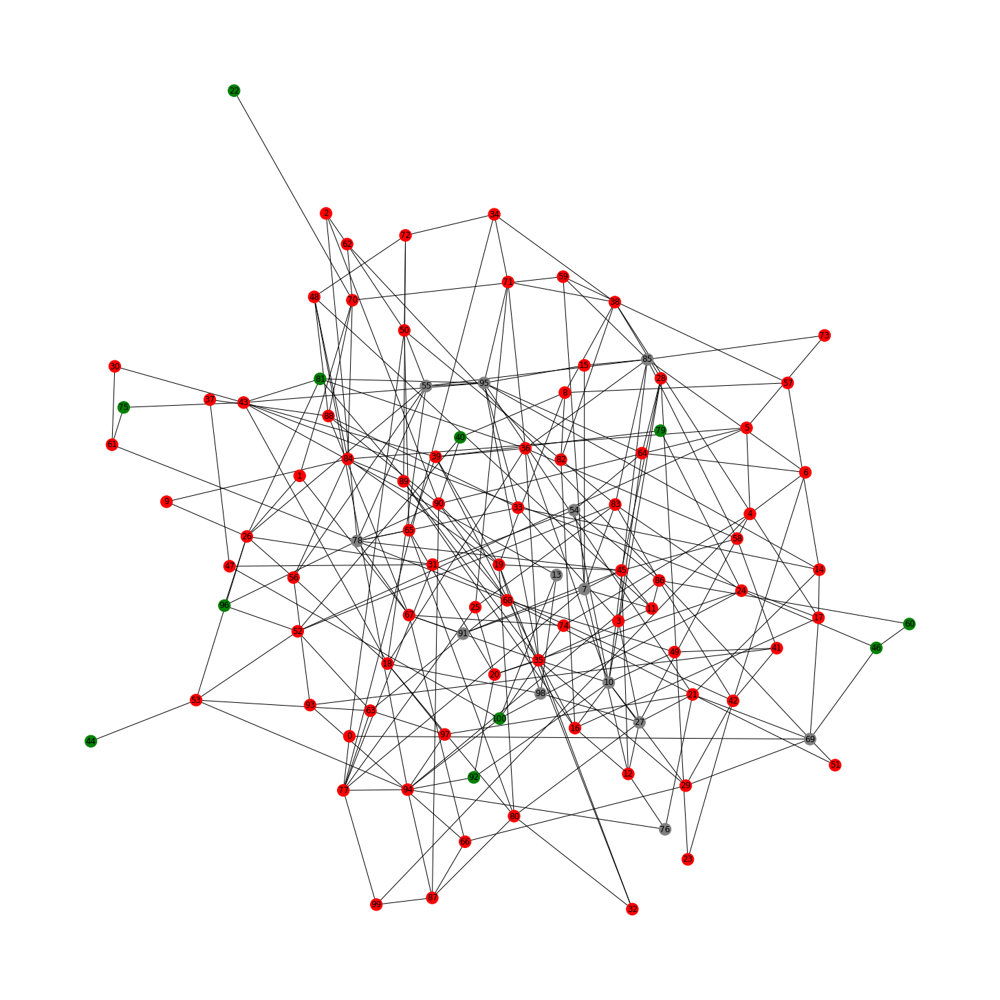

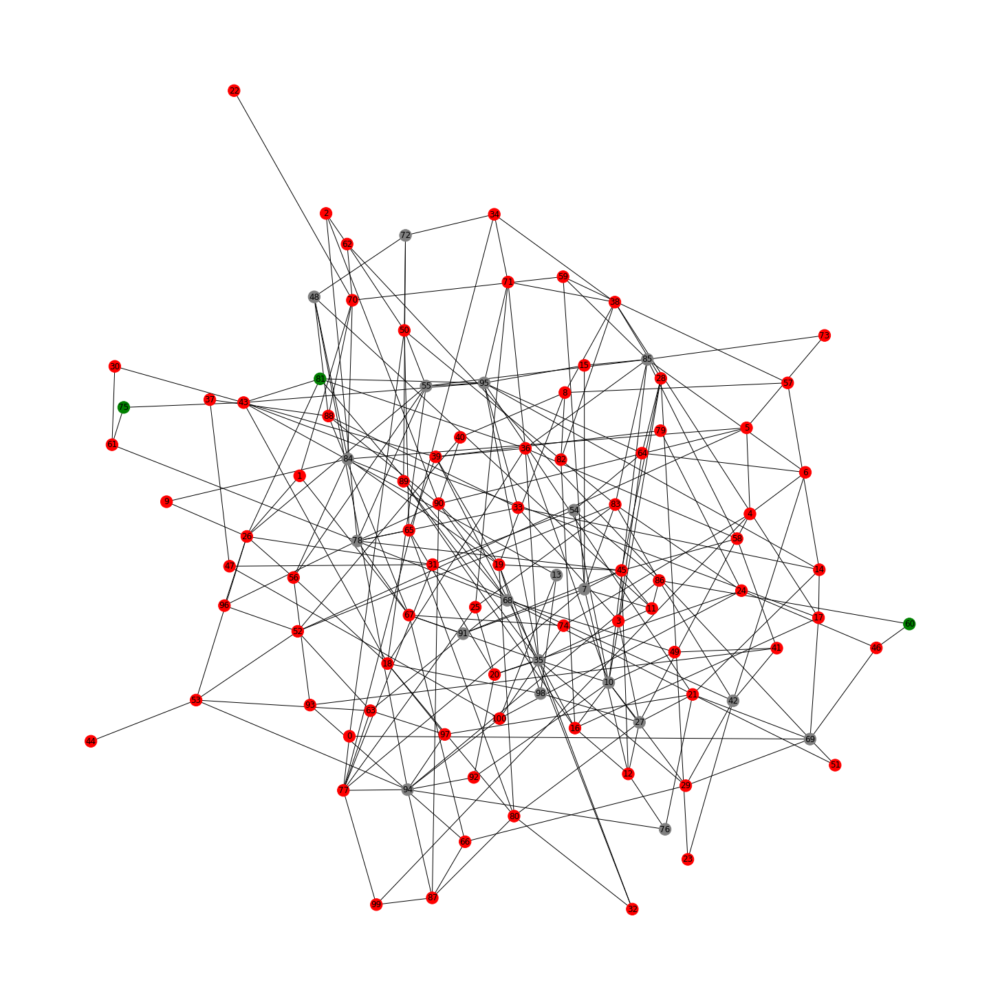

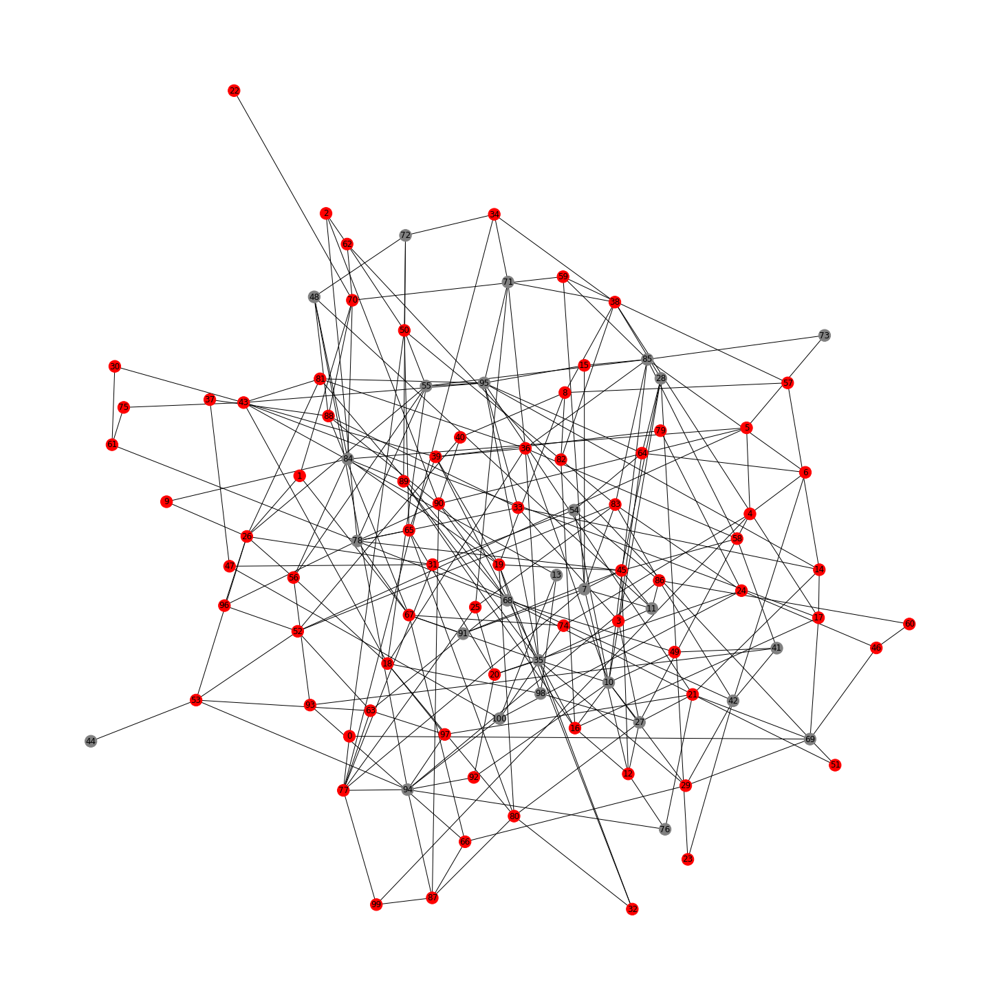

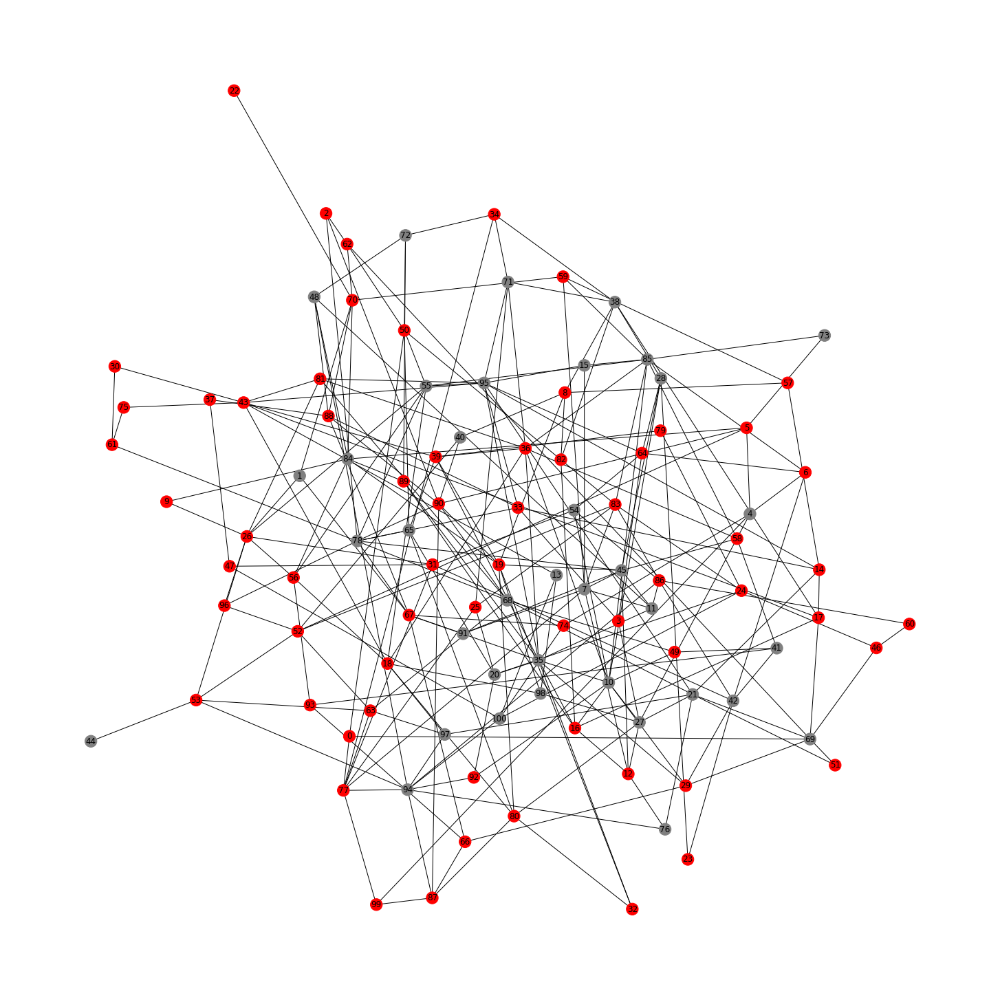

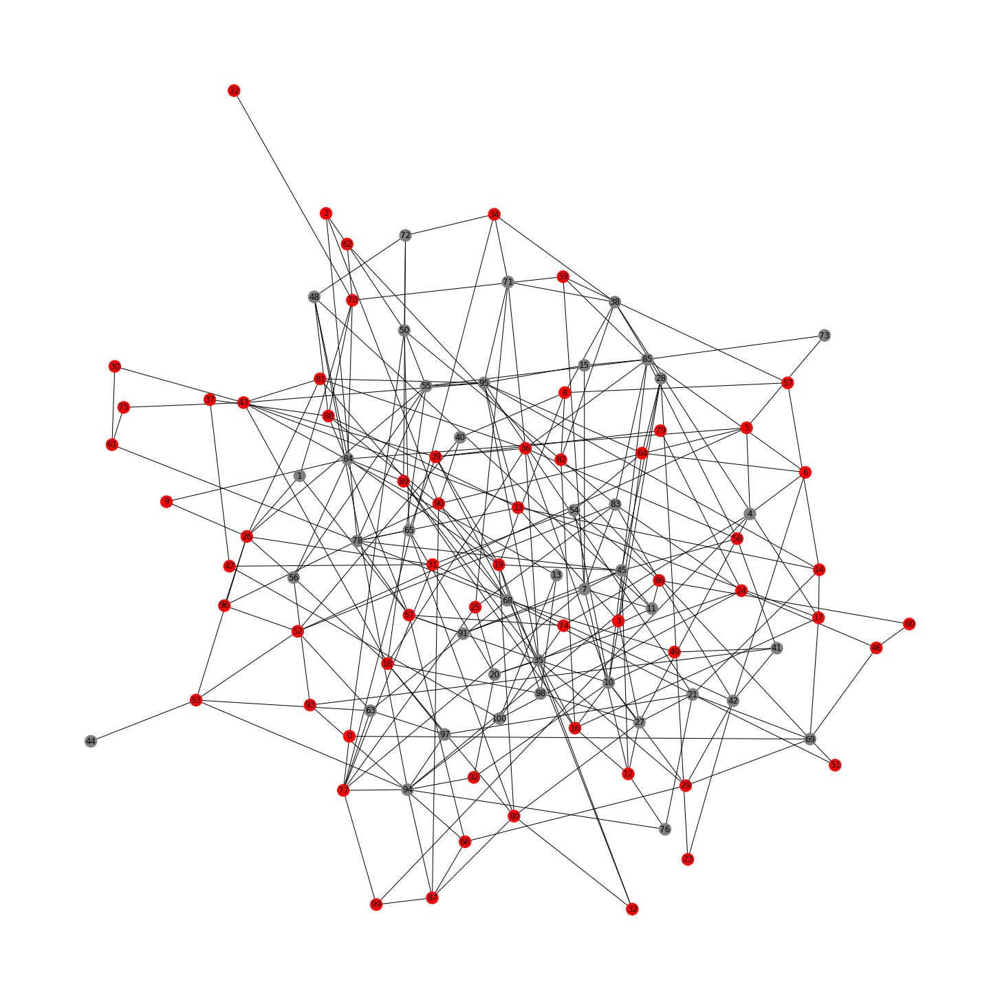

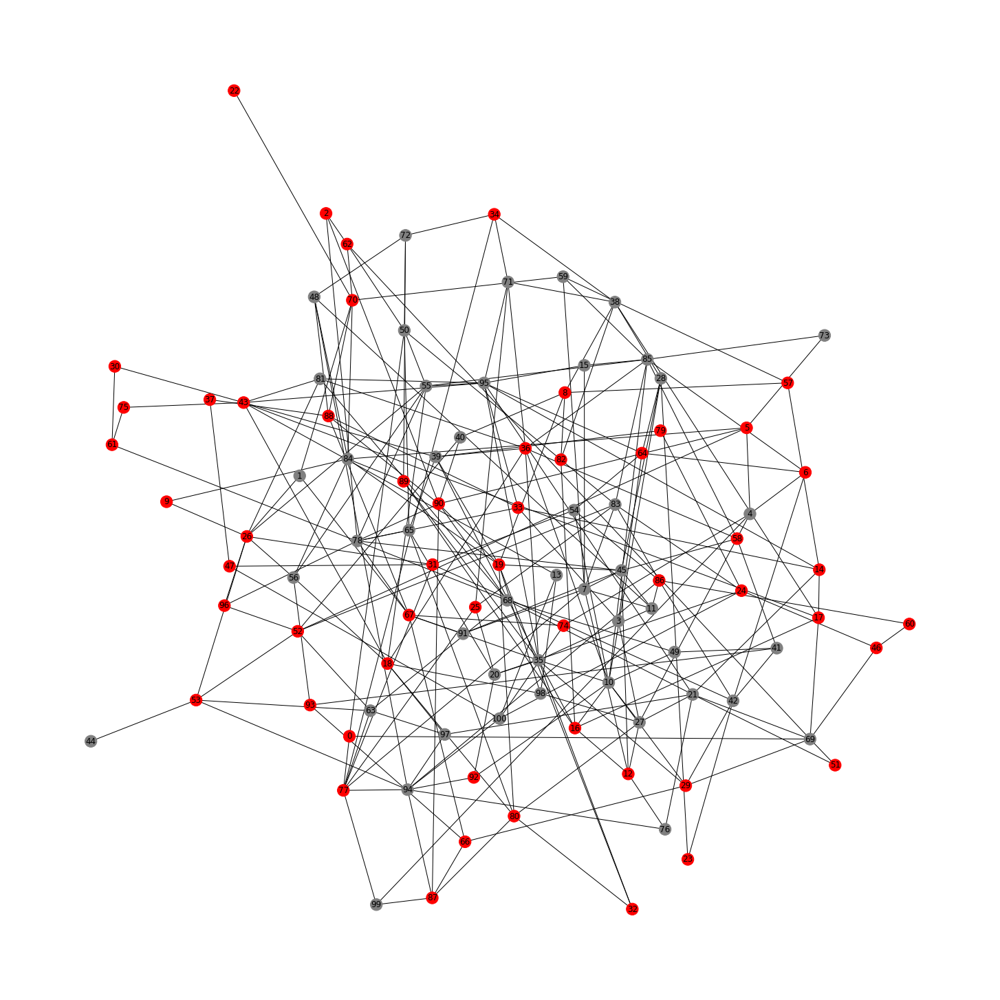

In [143]:
import networkx as nx
import matplotlib.pyplot as plt
from fa2l import force_atlas2_layout
import ndlib.models.ModelConfig as mc
import ndlib.models.epidemics as ep


positions = force_atlas2_layout(erdos_renyi_graph,
                                iterations=100,
                                pos_list=None,
                                node_masses=None,
                                outbound_attraction_distribution=False,
                                lin_log_mode=False,
                                prevent_overlapping=False,
                                edge_weight_influence=1.0,

                                jitter_tolerance=1.0,
                                barnes_hut_optimize=True,
                                barnes_hut_theta=0.5,

                                scaling_ratio=2.0,
                                strong_gravity_mode=False,
                                multithread=False,
                                gravity=1.0)

# Model selection
model = ep.SIRModel(erdos_renyi_graph)

# Model Configuration
cfg = mc.Configuration()
cfg.add_model_parameter('beta', 0.5)
cfg.add_model_parameter('gamma', 0.1)
cfg.add_model_parameter("fraction_infected", 0.05)
model.set_initial_status(cfg)

number_of_iteration = 10
# Simulation execution
iterations = model.iteration_bunch(number_of_iteration)

color_map = []
for iteration in range(erdos_renyi_graph.number_of_nodes()):
    color_map.append('green')

for iteration in iterations:
    for index, status in iteration['status'].items():
        if status == 1:
            color_map[index] = 'red'
        if status == 2:
            color_map[index] = 'grey'
    plt.figure(figsize=(20,20))
    nx.draw(erdos_renyi_graph, positions, node_color=color_map, with_labels=True)
    plt.show()

Simulacion G2-------> Preferential attachment

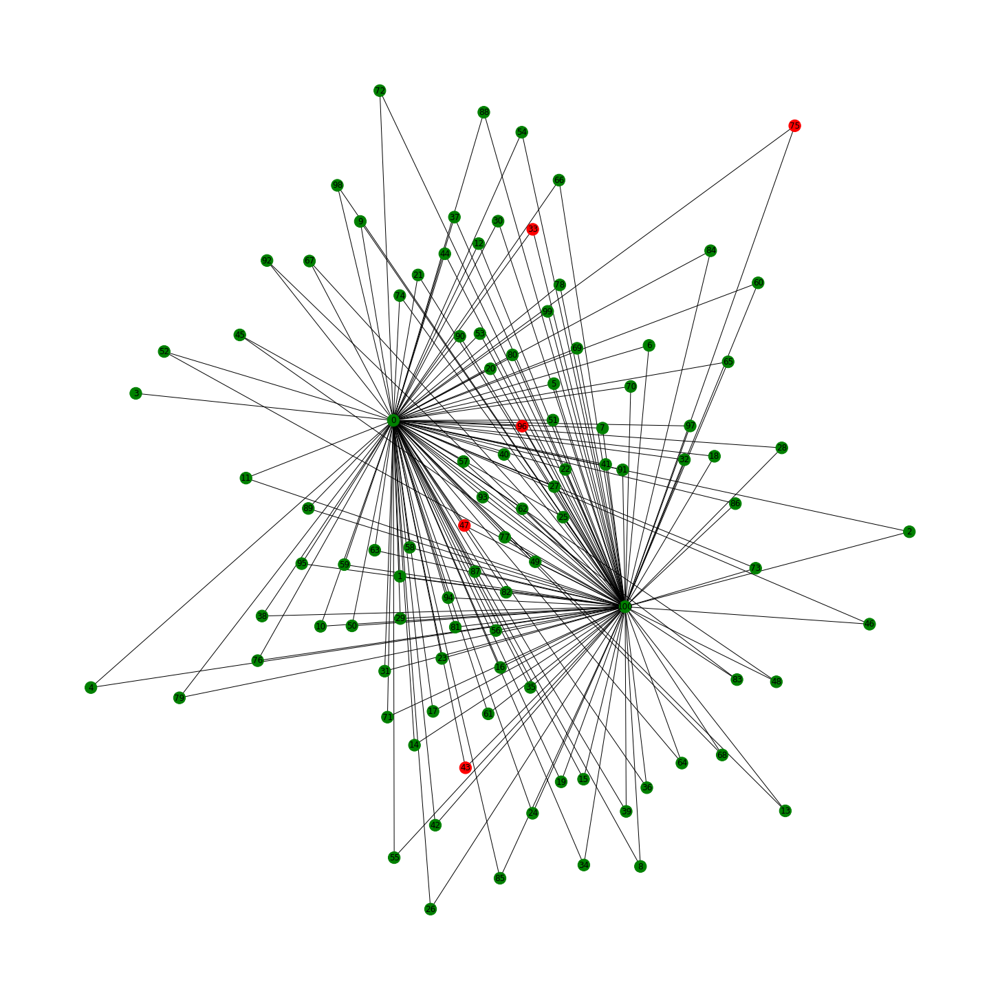

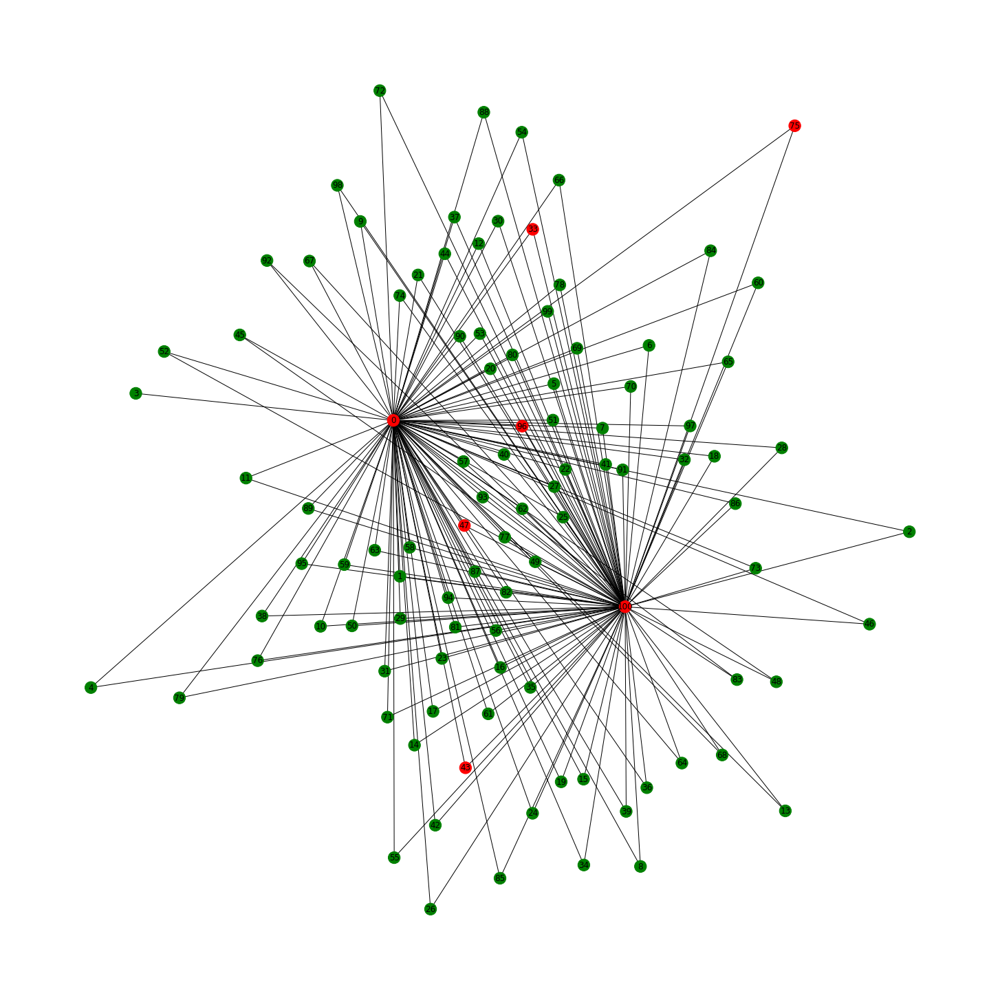

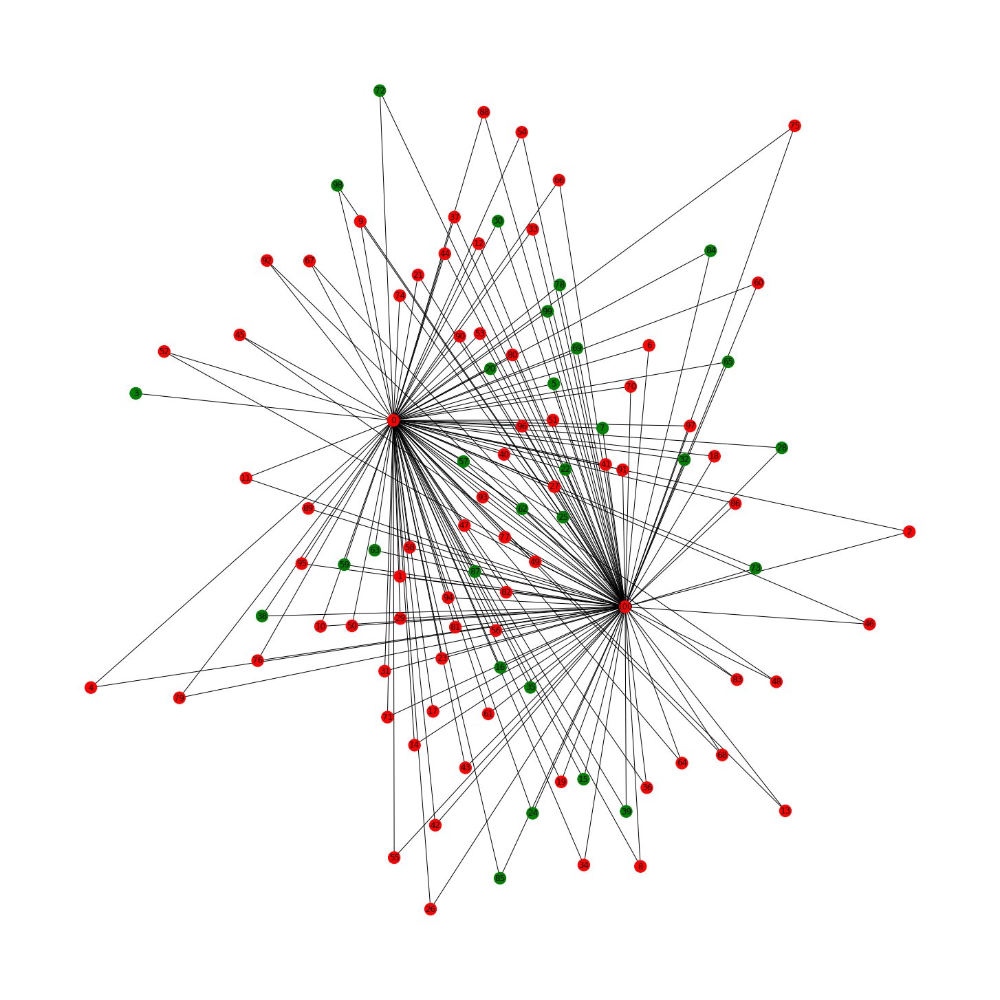

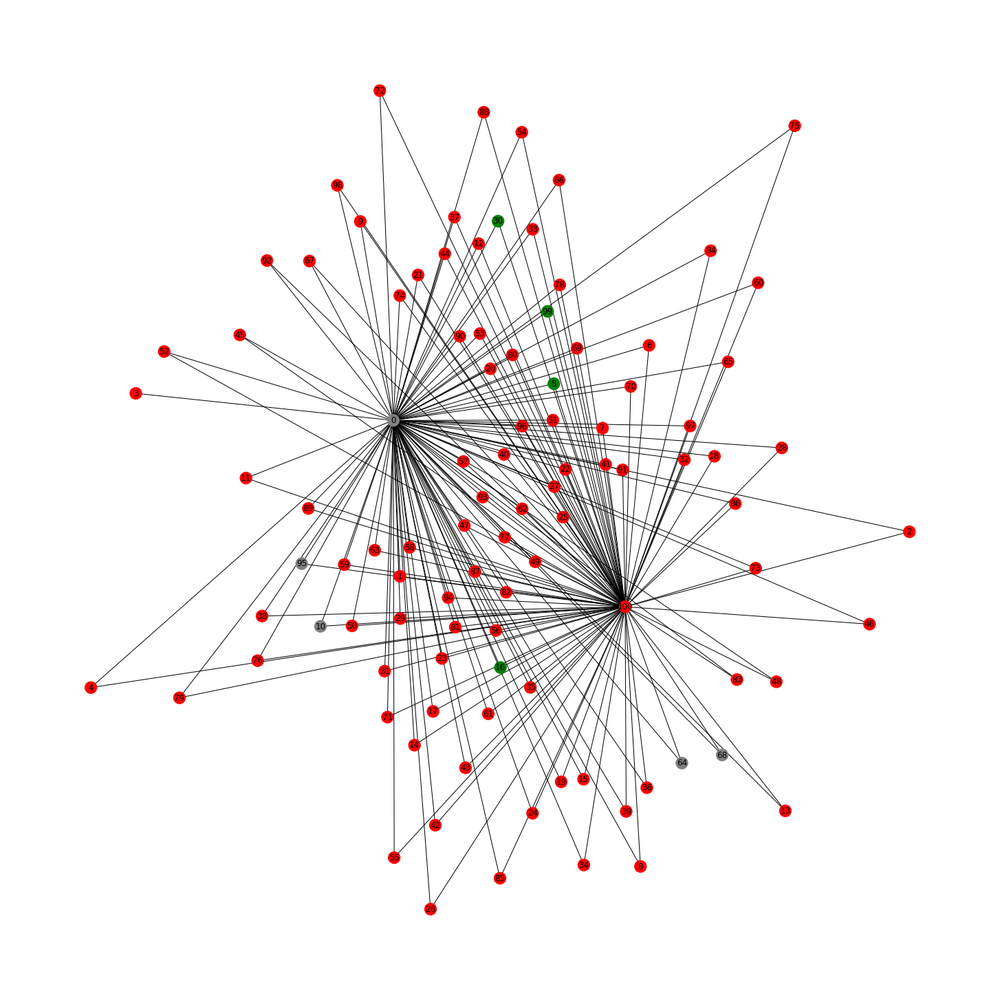

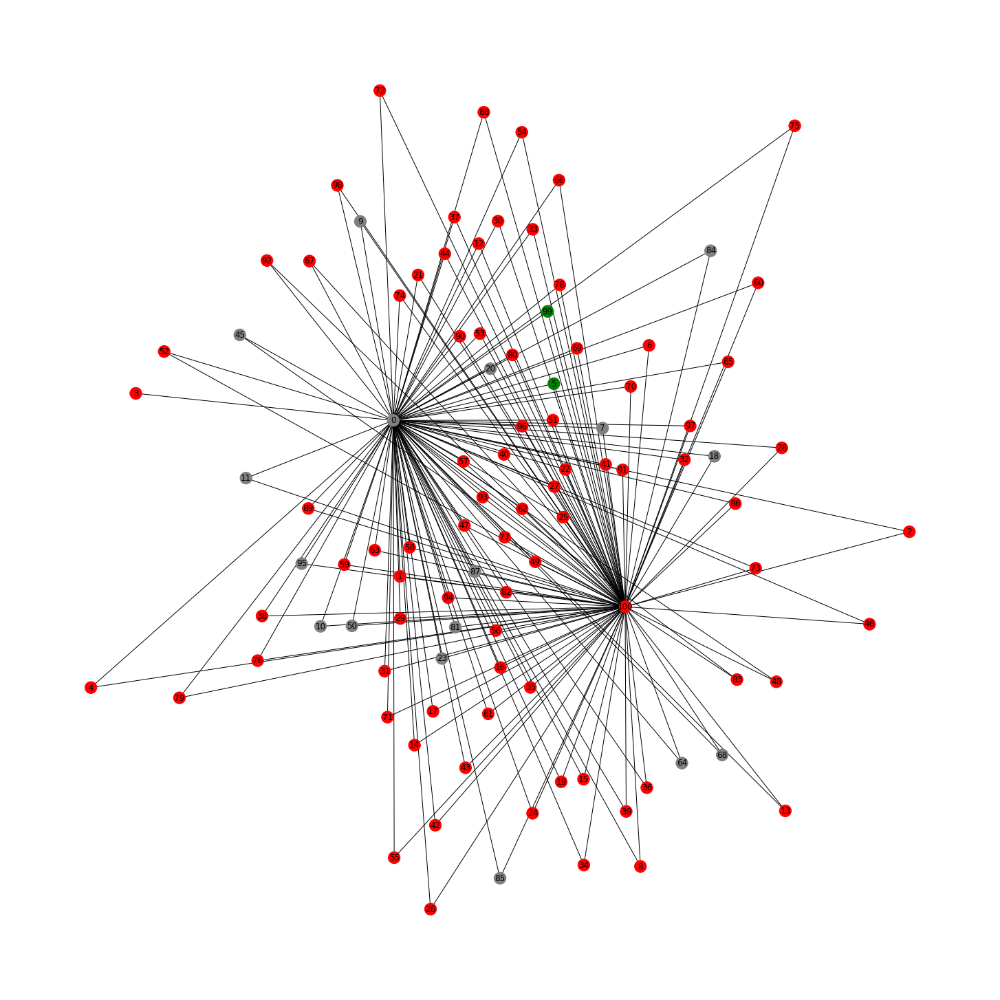

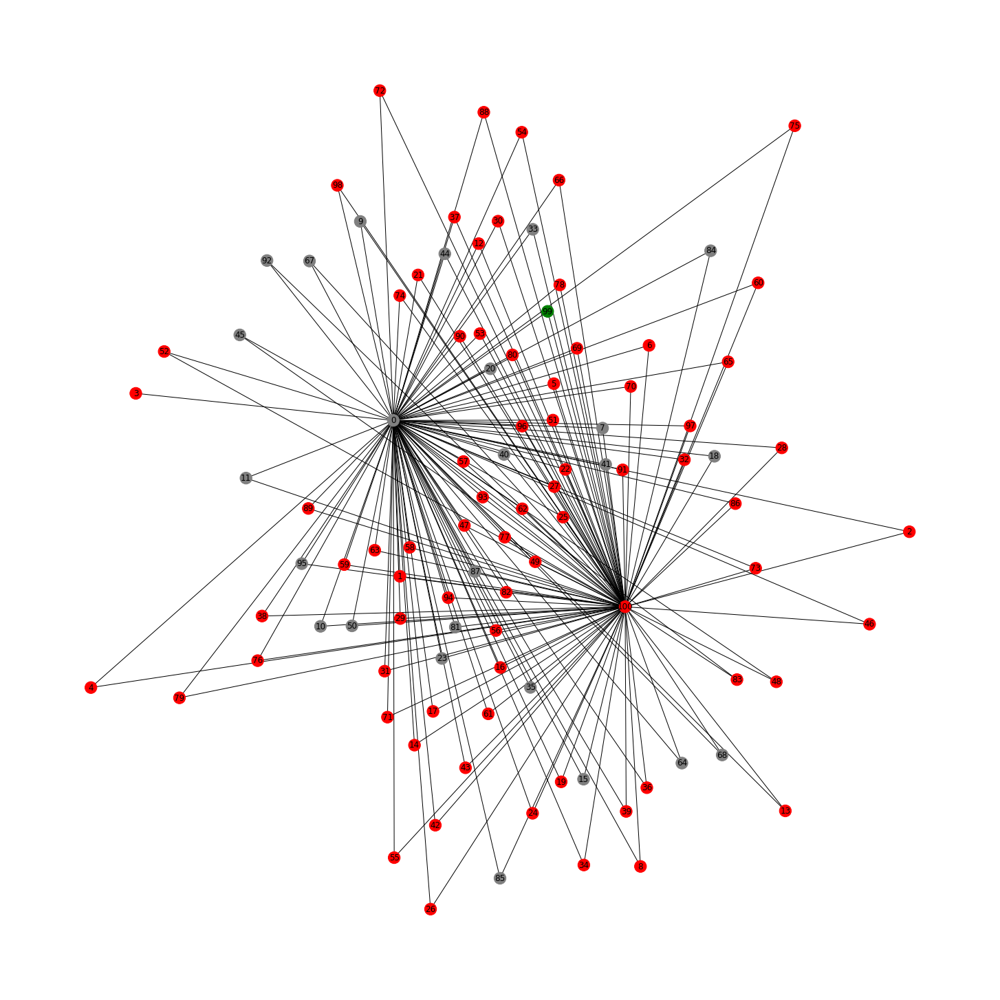

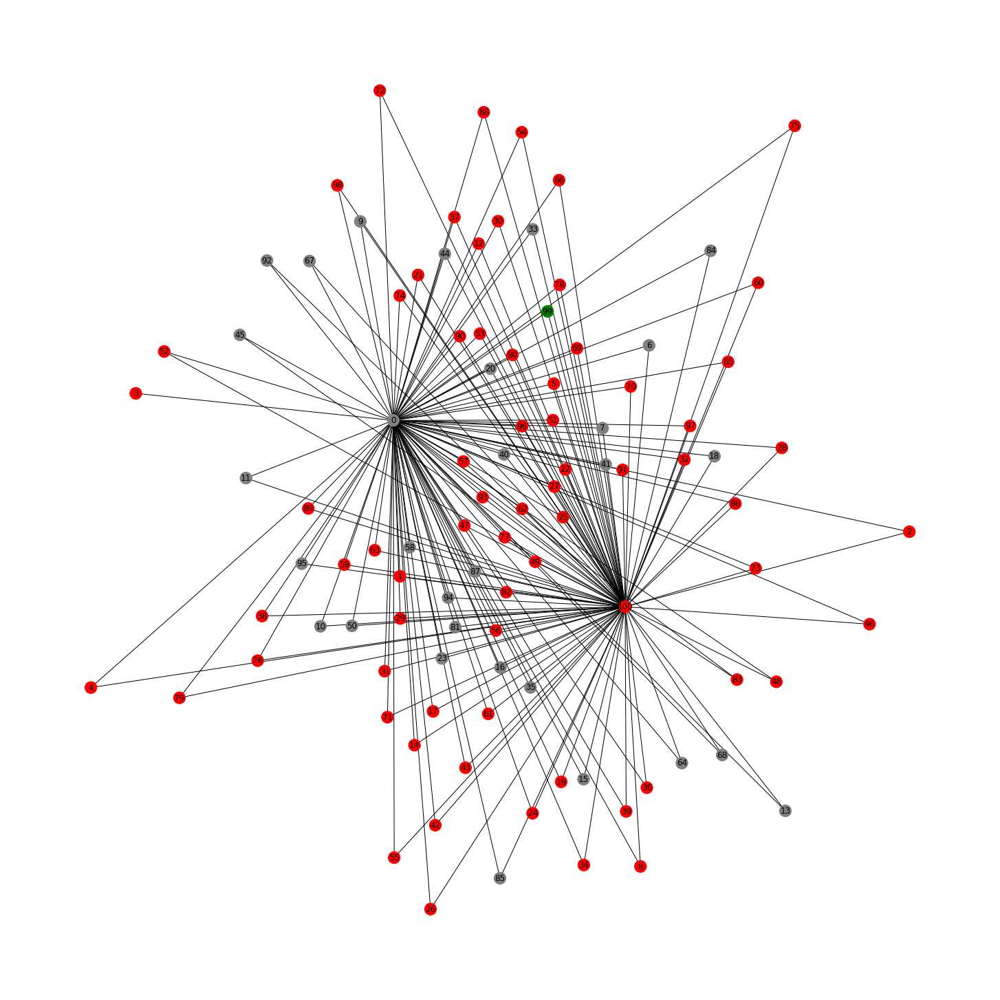

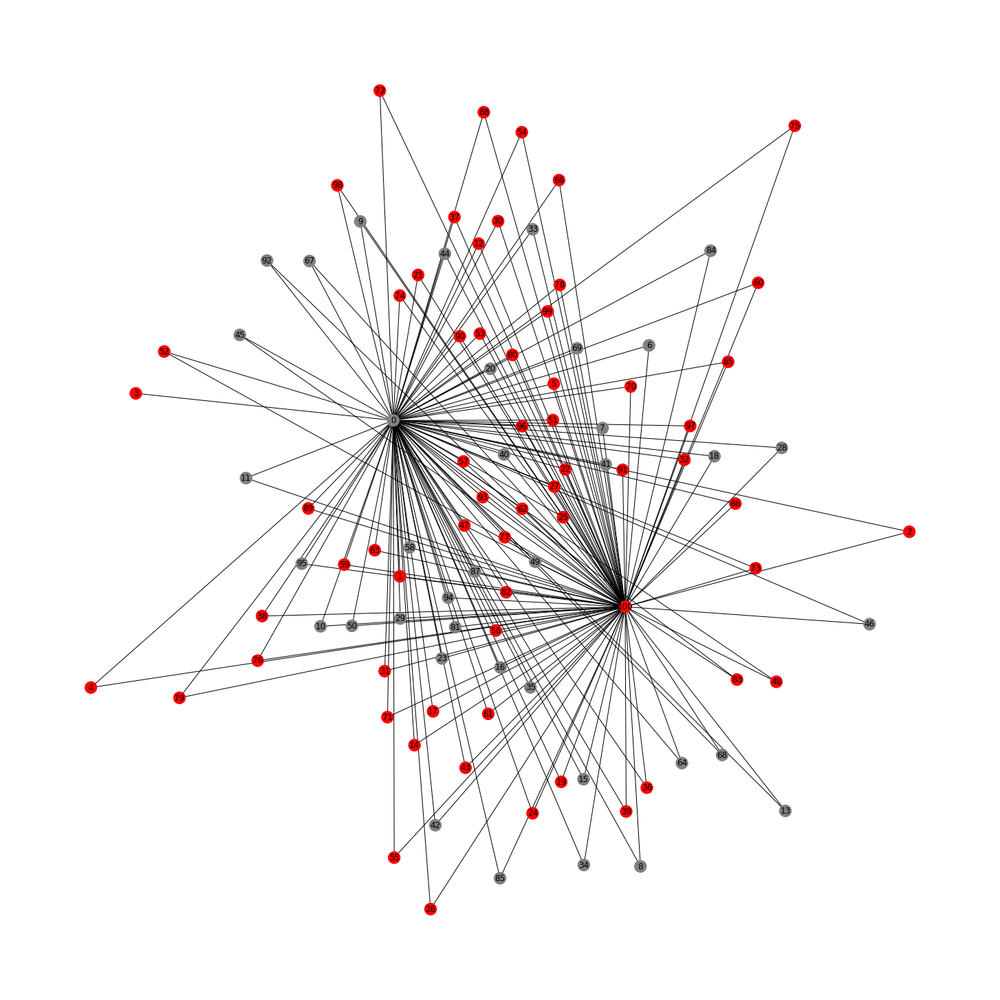

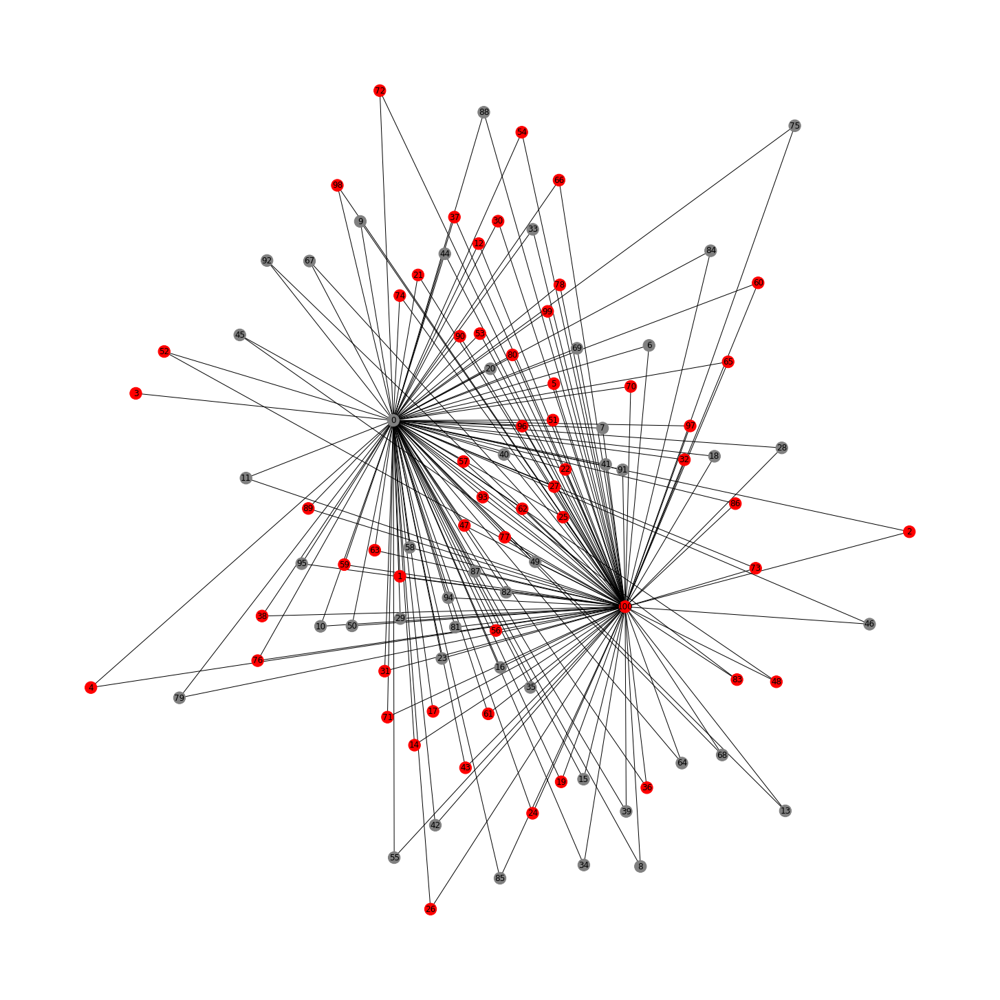

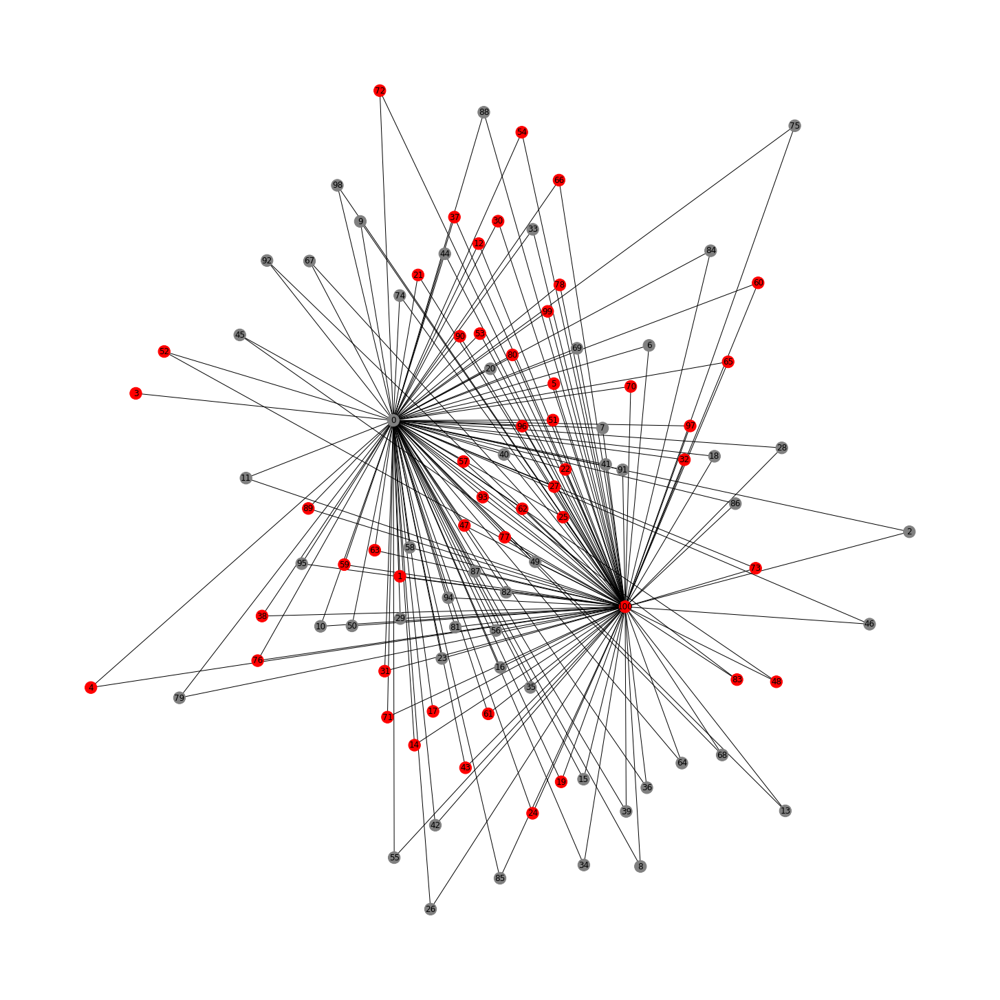

In [144]:
import networkx as nx
import matplotlib.pyplot as plt
from fa2l import force_atlas2_layout
import ndlib.models.ModelConfig as mc
import ndlib.models.epidemics as ep


positions = force_atlas2_layout(G2,
                                iterations=100,
                                pos_list=None,
                                node_masses=None,
                                outbound_attraction_distribution=False,
                                lin_log_mode=False,
                                prevent_overlapping=False,
                                edge_weight_influence=1.0,

                                jitter_tolerance=1.0,
                                barnes_hut_optimize=True,
                                barnes_hut_theta=0.5,

                                scaling_ratio=2.0,
                                strong_gravity_mode=False,
                                multithread=False,
                                gravity=1.0)

# Model selection
model = ep.SIRModel(G2)

# Model Configuration
cfg = mc.Configuration()
cfg.add_model_parameter('beta', 0.5)
cfg.add_model_parameter('gamma', 0.1)
cfg.add_model_parameter("fraction_infected", 0.05)
model.set_initial_status(cfg)

number_of_iteration = 10
# Simulation execution
iterations = model.iteration_bunch(number_of_iteration)

color_map = []
for iteration in range(G2.number_of_nodes()):
    color_map.append('green')

for iteration in iterations:
    for index, status in iteration['status'].items():
        if status == 1:
            color_map[index] = 'red'
        if status == 2:
            color_map[index] = 'grey'

    plt.figure(figsize=(20,20))
    nx.draw(G2, positions, node_color=color_map, with_labels=True)
    
    plt.show()

In [88]:
import pandas as pd
path= "/content/drive/MyDrive/PARCIAL_2/ratings_Electronics (1) 2.csv"
df= pd.read_csv(path)
df.head()

,AKM1MP6P0OYPR,0132793040,5.0,1365811200
0,A2CX7LUOHB2NDG,0321732944,5.0,1341100800
1,A2NWSAGRHCP8N5,0439886341,1.0,1367193600
2,A2WNBOD3WNDNKT,0439886341,3.0,1374451200
3,A1GI0U4ZRJA8WN,0439886341,1.0,1334707200
4,A1QGNMC6O1VW39,0511189877,5.0,1397433600


# Nueva sección

In [ ]:
amazon_graph = nx.from_pandas_edgelist(df, source= "AKM1MP6P0OYPR",target= "0132793040")

In [ ]:
print(amazon_graph)

Graph with 4677699 nodes and 7824482 edges


In [ ]:
plt.figure(figsize=(20,20))
nx.draw_networkx(amazon_graph)